In [77]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

from math import *
import numpy as np
from matplotlib import pyplot as plt
from scipy.stats import ortho_group
from scipy.interpolate import griddata
np.set_printoptions(precision=7)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [9]:
from chemistry import *
from chemistry.functions import GaussianWrapper
from chemistry.optimization import GradientDescent, delta_strategies, stop_strategies

In [10]:
charges = [1, 1, 8]
eq = np.array([0.00000000000, -1.09968100000, 0.45789805000,
               -0.00000000000, -0.27205852000, 1.79203420000,
               0.00000000000, -1.20765850000, 1.44866350000])

molecule = functions.Molecule([1, 1, 8], 3, 750)
optimizer = GradientDescent(delta_strategies.FollowGradient(), stop_strategies.GradNorm(1e-4))
path = optimizer(molecule, eq)

In [11]:
eq = path[-1]
molecule.grad(eq)

array([ -1.5324350e-16,   5.8036650e-06,  -9.3769911e-06,   6.3625957e-17,
        -1.0918422e-05,   1.0633588e-06,   8.9617546e-17,   5.1147569e-06,
         8.3136324e-06])

In [12]:
molecule = functions.Molecule([1, 1, 8], 3, 750)
normalized = utils.linalg.get_normal_coordinate(molecule, eq)

In [66]:
def sample_on_sphere(func, max_r, n_r, n_phi):
    vects = []
    values = []
    for axis_num in range(3):
        for r in np.linspace(0, max_r, n_r)[1:]:
            for phi in np.linspace(0, 2 * pi, n_phi):
                for sign in [-1, 1]:
                    x = r * cos(phi)
                    y = r * sin(phi)
                    z = sign * np.sqrt(abs(max_r**2 - x**2 - y**2))

                    vect = np.array([x, y, z])
                    vect = np.roll(vect, axis_num)
                    vects.append(vect)
                    values.append(normalized(vect))
        
    return vects, values

def plot_in_polar(phis, rs, vs, ax, n_grid=100, is_contour=False):
    max_r = np.max(rs)

    grid_phi = np.linspace(0.0, 2 * pi, n_grid)
    grid_r = np.linspace(0, 2 * pi, n_grid)
    grid_phi, grid_r = np.meshgrid(grid_phi, grid_r)

    data = griddata((phis, rs / np.max(rs) * 2 * pi), vs, (grid_phi, grid_r), method='linear')
    grid_r = .5 * max_r * grid_r / pi

    if is_contour:
        ax.contour(grid_phi, grid_r, data, 200)
    else:
        ax.pcolormesh(grid_phi, grid_r, data)
#     ax.scatter(phis, rs, s=1, c='r')
    
def global_to_polar(vects, axis_num, orient, r_eps=1e-7):
    phis = []
    rs = []
    inds = []
    
    for i, vect in enumerate(vects):
#         if axis_num == 0:
#             print(orient, vect[axis_num], orient * vect[axis_num], orient * vect[axis_num] < 0)
        if orient * vect[axis_num] < 0:
            continue

        vect = np.array([vect[(axis_num + 1) % 3], vect[(axis_num + 2) % 3]])

        if abs(np.linalg.norm(vect)) < r_eps:
            continue

        phis.append(atan2(vect[1], vect[0]))
        if phis[-1] < 0:
            phis[-1] += 2 * pi
        rs.append(np.linalg.norm(vect))
        inds.append(i)
        
    return phis, rs, inds

    
def plot_all_spheres(vects, values, r_eps=1e-7, title=None, n_grid=100, is_contour=False, **fig_kw):
    fig, axs = plt.subplots(3, 2, subplot_kw={'projection': 'polar'}, **fig_kw)
    plt.suptitle(title)
    
    for axis_num in range(3):
        for orient_num, orient in enumerate([1, -1]):
            phis, rs, inds = global_to_polar(vects, axis_num, orient, r_eps)
            vs = [values[i] for i in inds]

            value = vs[np.argmin(rs)]
            for phi in set(phis):
                phis.append(phi)
                rs.append(0)
                vs.append(value)

            phis = np.array(phis)
            vs = np.array(vs)
            rs = np.array(rs)
            axs[axis_num][orient_num].set_title('{}'.format(orient * utils.linalg.eye(3, axis_num)))
            plot_in_polar(phis, rs, vs, axs[axis_num][orient_num])
            
    return axs

def plot_path(axs, path):
    for axis_num, ax_row in enumerate(axs):
        for orient_num, ax in enumerate(ax_row):
            phis, rs, inds = global_to_polar(path, axis_num, 1 - orient_num * 2)
            print(len(path), len(phis), len(rs))
            if len(phis):
                ax.plot(phis, rs, c='r')
                ax.scatter(phis[-1:], rs[-1:])

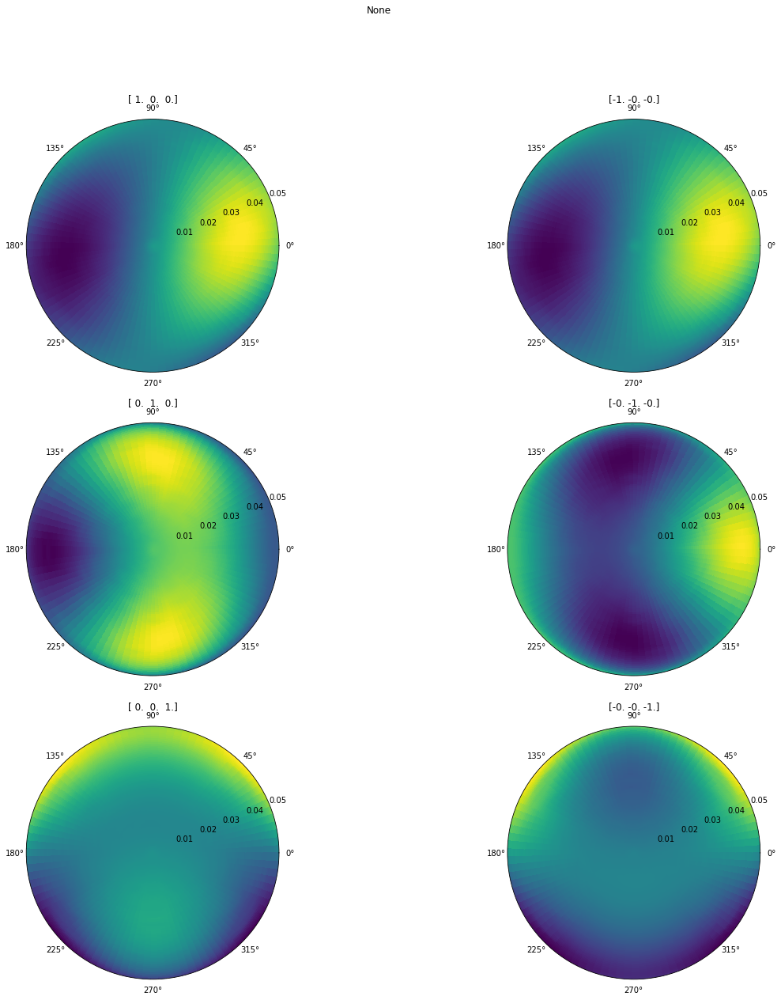

In [78]:
# MAX_R = .05
# N_PHI = 15
# N_R = 15
# vects, values = sample_on_sphere(molecule, MAX_R, N_R, N_PHI)

axs = plot_all_spheres(vects, values, figsize=(20, 20), n_grid=250, is_contour=True)

-75.97278064044059 [-0.0026338 -0.0499188  0.0010831] 9.37424466593e-05 0.0468712233296
-75.97278474045325 [-0.0029883 -0.0498954 -0.0012331] 8.10742347837e-05 0.0405371173919
-75.9727877936093 [-0.0033672 -0.0497824 -0.0032208] 6.95291694169e-05 0.0347645847084
-75.9727900352767 [-0.0037729 -0.0496158 -0.0049027] 5.94826247623e-05 0.0297413123812
-75.97279167781774 [-0.0042082 -0.0494213 -0.0063112] 5.1093828354e-05 0.025546914177
-75.972792895094 [-0.004676  -0.0492154 -0.0074818] 4.43927194869e-05 0.0221963597434
-75.97279382160741 [-0.0051796 -0.0490081 -0.0084487] 3.93376624983e-05 0.0196688312492
-75.9727945580809 [-0.0057223 -0.0488039 -0.009243 ] 3.58391388866e-05 0.0179195694433
-75.9727951789603 [-0.0063074 -0.0486043 -0.0098914] 3.37595460941e-05 0.0168797730471
-75.97279573927908 [-0.0069383 -0.0484082 -0.0104167] 3.29109451027e-05 0.0164554725514
-75.97279628023156 [-0.0076179 -0.0482132 -0.0108375] 3.30694513935e-05 0.0165347256968
-75.97279683332741 [-0.008349  -0.048016

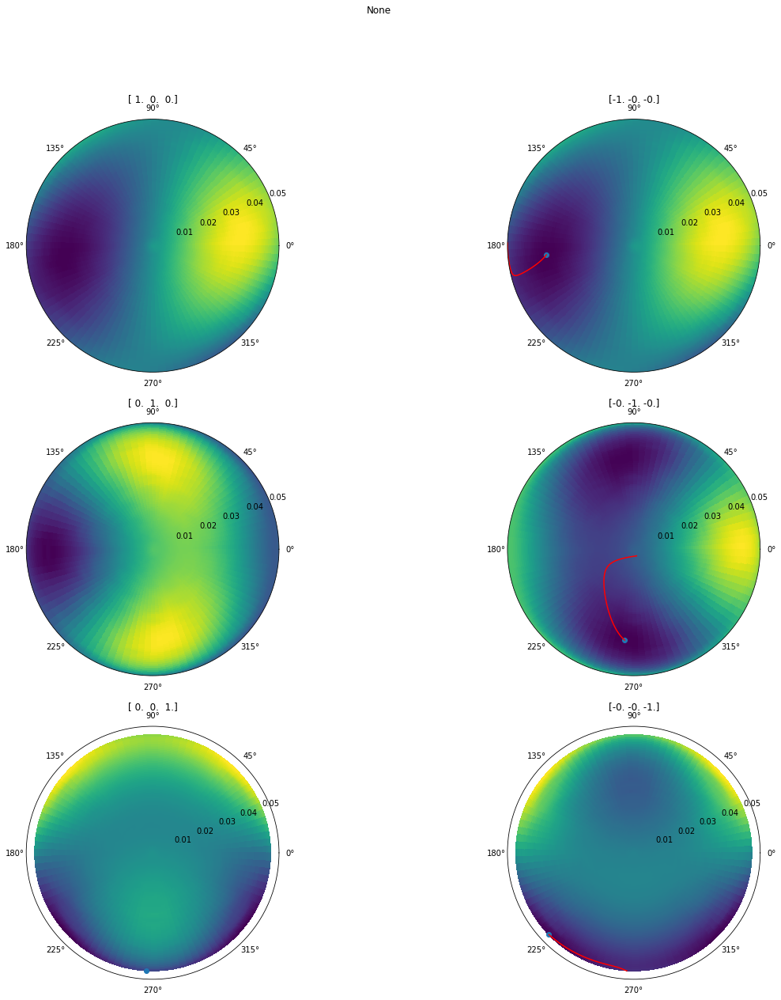

-75.97261763424946 [-0.0265769  0.0371414  0.0203515] 0.000123080947836 0.0615404739182
-75.97262567353926 [-0.0255849  0.0362119  0.0231109] 0.000137753487513 0.0688767437566
-75.972635602058 [-0.0245122  0.0348951  0.0261053] 0.000149832989011 0.0749164945054
-75.97264713091721 [-0.0233647  0.033168   0.0292229] 0.000156973021421 0.0784865107107
-75.97265950846935 [-0.0221634  0.0310642  0.0323079] 0.000157310288596 0.0786551442978
-75.9726716521983 [-0.0209475  0.0286846  0.0351909] 0.000150384067312 0.0751920336559
-75.9726825084487 [-0.0197682  0.0261807  0.0377331] 0.000137484688085 0.0687423440424
-75.97269141624147 [-0.0186756  0.0237138  0.0398607] 0.00012106021192 0.0605301059599
-75.97269822813672 [-0.0177051  0.0214129  0.0415694] 0.000103643359777 0.0518216798884
-75.97270317490319 [-0.0168729  0.0193542  0.0429036] 8.70787989537e-05 0.0435393994768
-75.97270664741268 [-0.0161781  0.0175642  0.0439291] 7.23475747291e-05 0.0361737873646
-75.9727090374744 [-0.0156098  0.0160

-75.9728224751441 [-0.0377158 -0.0328182 -0.0006948] 1.81884507518e-05 0.00909422537589
-75.97282263018327 [-0.0375308 -0.03302   -0.0010579] 1.59090702656e-05 0.00795453513279
-75.97282274881965 [-0.037364  -0.0331971 -0.0013724] 1.39208671245e-05 0.00696043356223
-75.97282283967375 [-0.037214  -0.0333529 -0.0016451] 1.21864616908e-05 0.00609323084539
-75.9728229093142 [-0.0370795 -0.0334899 -0.0018817] 1.06729835546e-05 0.00533649177728
-75.97282296274211 [-0.0369591 -0.0336105 -0.002087 ] 9.35169320717e-06 0.00467584660358
-75.97282300376908 [-0.0368517 -0.0337167 -0.0022655] 8.19756657443e-06 0.00409878328722
-75.97282303530025 [-0.036756  -0.0338103 -0.0024206] 7.18887598191e-06 0.00359443799095
-75.97282305955416 [-0.0366708 -0.0338928 -0.0025557] 6.30676618711e-06 0.00315338309356
-75.97282307822378 [-0.0365951 -0.0339655 -0.0026733] 5.53489730553e-06 0.00276744865277
-75.9728230926056 [-0.0365278 -0.0340296 -0.0027758] 4.85911165536e-06 0.00242955582768
-75.97282310369161 [-0.0

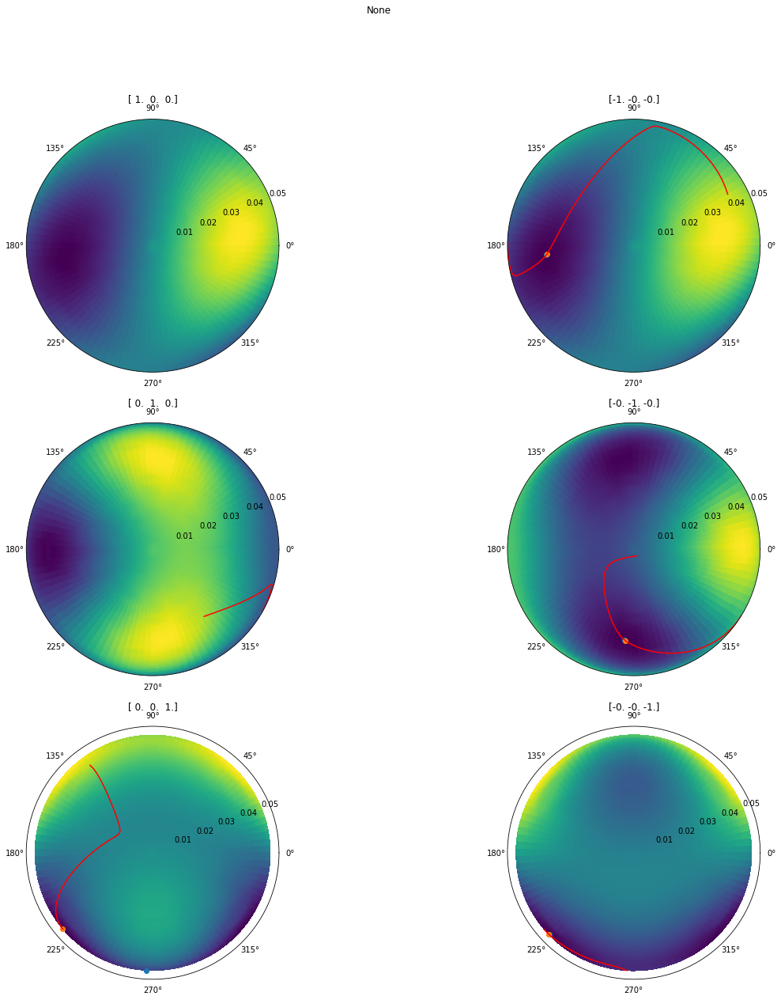

-75.97268628771512 [ 0.0256959  0.0212716  0.0372457] 0.000138544671934 0.0692723359668
-75.9726952278658 [ 0.0247384  0.018622   0.0392586] 0.000119003151185 0.0595015755927
-75.97270174138788 [ 0.0239105  0.0162208  0.0408065] 9.96672250141e-05 0.0498336125071
-75.97270627852436 [ 0.0232394  0.0141171  0.04196  ] 8.2357496244e-05 0.041178748122
-75.97270936914713 [ 0.0227289  0.0123085  0.0428007] 6.78073104013e-05 0.0339036552006
-75.97271146720716 [ 0.0223692  0.010765   0.043402 ] 5.60844489071e-05 0.0280422244535
-75.97271290937002 [ 0.0221451  0.0094463  0.043822 ] 4.69676549346e-05 0.0234838274673
-75.97271392940944 [ 0.0220402  0.0083113  0.0441039] 4.01504819133e-05 0.0200752409566
-75.97271468418926 [ 0.0220398  0.0073229  0.0442789] 3.53298231126e-05 0.0176649115563
-75.97271527816983 [ 0.0221312  0.0064491  0.0443691] 3.22222636772e-05 0.0161111318386
-75.97271578153835 [ 0.0223043  0.0056626  0.0443898] 3.05545556194e-05 0.0152772778097
-75.97271624264131 [ 0.0225511  0.0

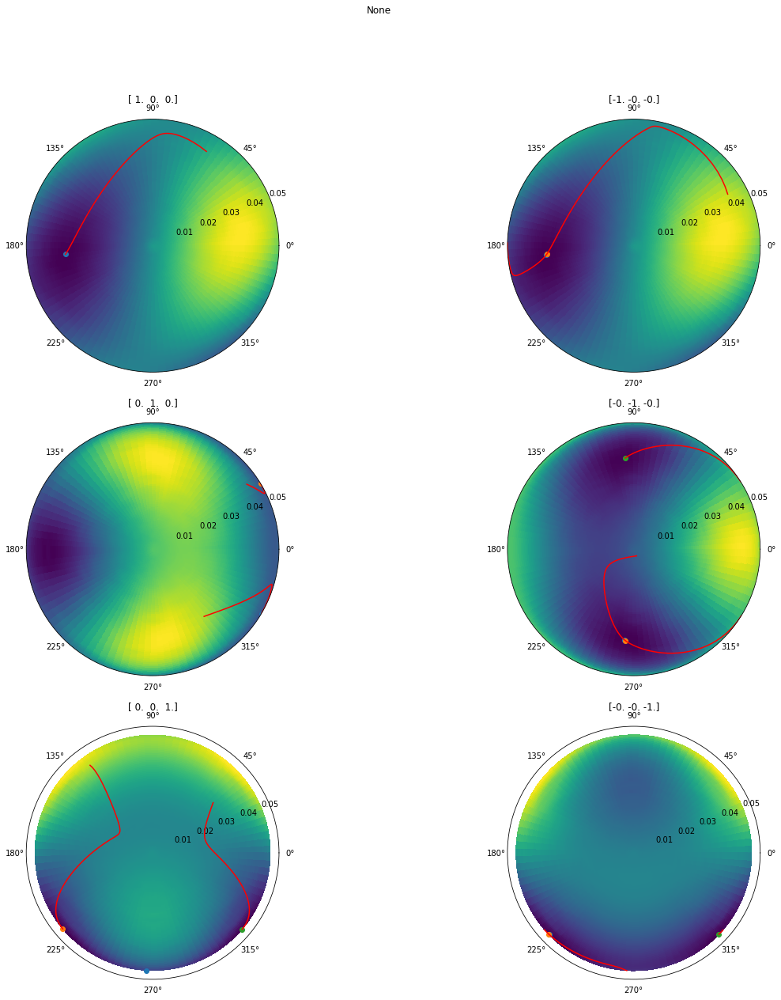

-75.97260512829848 [ 0.0347542  0.0350597 -0.0079353] 0.0001150166771 0.05750833855
-75.9726125405652 [ 0.0336582  0.0354327 -0.0105667] 0.000142386831345 0.0711934156726
-75.97262375891893 [ 0.0320577  0.035834  -0.0137197] 0.000171917186456 0.0859585932278
-75.97263978044175 [ 0.0298133  0.0361883 -0.0173659] 0.000199258407223 0.0996292036116
-75.97266066171181 [ 0.02684    0.036381  -0.0213551] 0.000217412149877 0.108706074939
-75.97268456316031 [ 0.0232025  0.036291  -0.0253891] 0.000219189646835 0.109594823417
-75.97270782142287 [ 0.0191847  0.0358599 -0.0290863] 0.000202270996259 0.10113549813
-75.97272685355715 [ 0.015224   0.0351431 -0.0321433] 0.000172024353687 0.0860121768433
-75.97274021868309 [ 0.011711   0.0342784 -0.0344651] 0.000137685045466 0.0688425227332
-75.97274863100284 [ 0.0088368  0.0334019 -0.0361418] 0.000106304868897 0.0531524344484
-75.97275360465152 [ 0.0066028  0.0325971 -0.037334 ] 8.07475605913e-05 0.0403737802956
-75.9727564675482 [ 0.0049139  0.0318971 

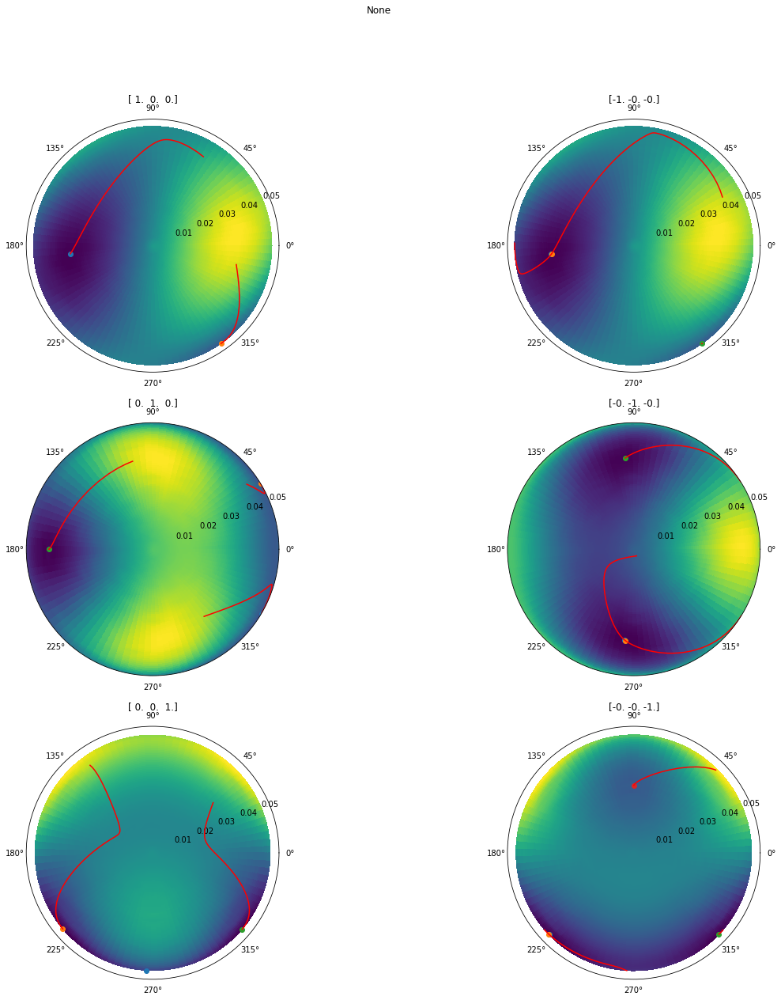

-75.9727316127236 [ 0.0226195 -0.0152043 -0.0419188] 8.04263126097e-05 0.0402131563048
-75.97273507301801 [ 0.0232153 -0.0168611 -0.0409482] 9.15334266355e-05 0.0457667133177
-75.97273952954683 [ 0.0238881 -0.0186903 -0.0397496] 0.00010299579 0.0514978949999
-75.97274512812318 [ 0.0246273 -0.0206767 -0.038288 ] 0.000114106373152 0.0570531865762
-75.9727519298077 [ 0.025415  -0.0227853 -0.0365364] 0.000123874704691 0.0619373523454
-75.9727598444556 [ 0.0262259 -0.0249587 -0.0344858] 0.000131116206614 0.0655581033068
-75.97276857928142 [ 0.0270296 -0.0271183 -0.0321558] 0.000134682527987 0.0673412639936
-75.97277764349352 [ 0.0277961 -0.0291731 -0.0296024] 0.000133802910369 0.0669014551844
-75.9727864369433 [ 0.0285019 -0.031035  -0.026916 ] 0.000128396153532 0.0641980767658
-75.97279440165909 [ 0.0291347 -0.0326363 -0.0242082] 0.000119163957865 0.0595819789327
-75.972801163094 [ 0.0296953 -0.0339417 -0.0215906] 0.000107378627557 0.0536893137783
-75.97280658907594 [ 0.0301933 -0.0349499 

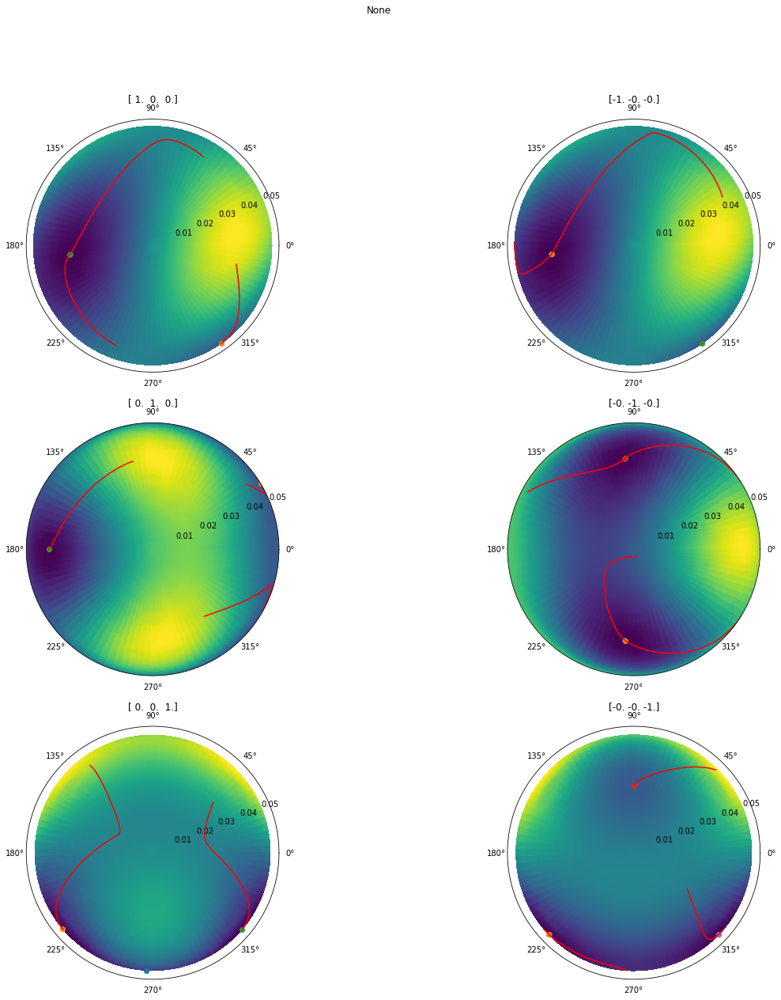

-75.97261752674964 [ 0.020508   0.0455974  0.0005452] 0.000123083401425 0.0615417007127
-75.97262560817742 [ 0.0183478  0.0464892 -0.0014553] 0.000139632441832 0.0698162209159
-75.97263594675017 [ 0.0160514  0.0471852 -0.0039892] 0.000156454463806 0.0782272319032
-75.97264880039845 [ 0.0136799  0.0475691 -0.0070741] 0.000171795205906 0.085897602953
-75.97266407239971 [ 0.0113178  0.0475215 -0.0106588] 0.000183015104226 0.0915075521129
-75.97268106286566 [ 0.0090677  0.0469534 -0.0145997] 0.000187164883517 0.0935824417586
-75.97269841350243 [ 0.0070345  0.0458492 -0.0186645] 0.000182275777227 0.0911378886135
-75.97271446321312 [ 0.0053006  0.0442952 -0.0225796] 0.000168649612782 0.0843248063911
-75.9727278945735 [ 0.0039036  0.0424628 -0.0261089] 0.000148942805738 0.0744714028689
-75.9727381847797 [ 0.0028314  0.0405489 -0.0291164] 0.00012680555729 0.0634027786452
-75.97274555242672 [ 0.0020369  0.0387144 -0.031576 ] 0.000105285412732 0.0526427063658
-75.97275059422866 [ 0.0014605  0.03

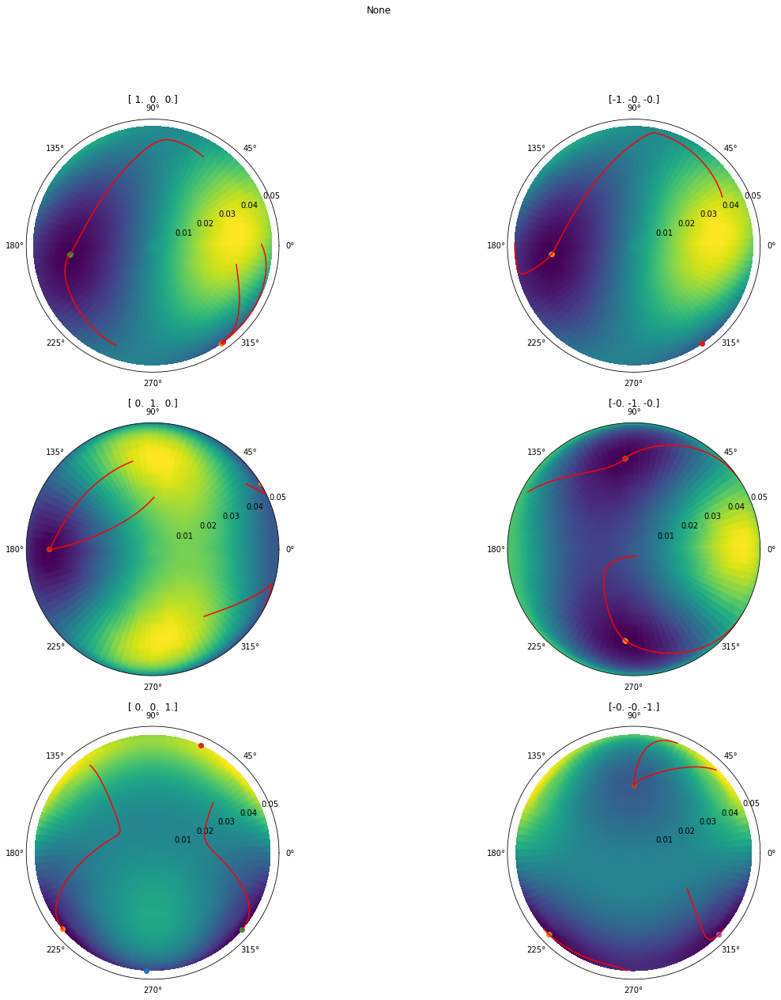

-75.97272817949707 [ 0.0062579 -0.0208245 -0.0450242] 6.37334160559e-05 0.0318667080279
-75.97273033802294 [ 0.0066178 -0.0222019 -0.0443089] 7.1662511513e-05 0.0358312557565
-75.97273305660008 [ 0.0070199 -0.0237222 -0.0434509] 7.99688314667e-05 0.0399844157333
-75.9727364250814 [ 0.0074679 -0.02538   -0.0424274] 8.83616903166e-05 0.0441808451583
-75.97274051182447 [ 0.0079649 -0.02716   -0.0412177] 9.642167371e-05 0.048210836855
-75.972745340452 [ 0.0085127 -0.029035  -0.0398058] 0.000103608198403 0.0518040992013
-75.97275086440649 [ 0.0091118 -0.0309648 -0.0381858] 0.000109306661166 0.0546533305828
-75.97275694819268 [ 0.0097613 -0.0328968 -0.0363664] 0.000112924179791 0.0564620898954
-75.97276336718032 [ 0.010459  -0.0347709 -0.0343743] 0.000114022999518 0.057011499759
-75.97276983477056 [ 0.011202  -0.0365258 -0.032255 ] 0.00011245234844 0.05622617422
-75.97277605420047 [ 0.0119877 -0.0381076 -0.0300683] 0.00010842235112 0.0542111755599
-75.97278177778348 [ 0.0128143 -0.0394773 -0

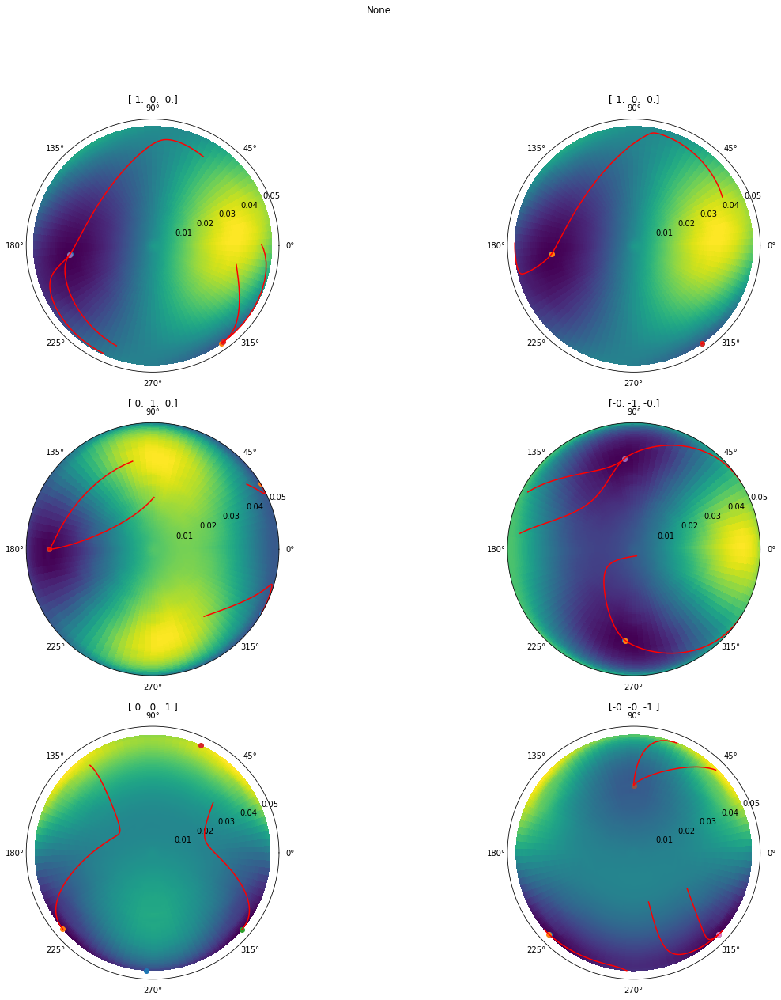

-75.97276581209341 [-0.0408256 -0.0132315  0.0256554] 0.000119199310392 0.0595996551962
-75.97277287990379 [-0.0410984 -0.0155769  0.0238387] 0.000117966438745 0.0589832193727
-75.97277977614594 [-0.0413337 -0.0177333  0.0218417] 0.000115709057709 0.0578545288547
-75.9727863700628 [-0.0414982 -0.0197083  0.0197354] 0.000112007326962 0.0560036634808
-75.97279250406008 [-0.0415719 -0.0215038  0.0175888] 0.000106801464466 0.0534007322328
-75.97279803966958 [-0.0415483 -0.0231208  0.0154649] 0.000100290126571 0.0501450632856
-75.97280288654025 [-0.0414323 -0.0245628  0.0134176] 9.28257863644e-05 0.0464128931822
-75.97280701266355 [-0.0412369 -0.0258367  0.0114882] 8.48171407247e-05 0.0424085703624
-75.9728104390444 [-0.0409796 -0.0269536  0.0097045] 7.66524224601e-05 0.03832621123
-75.97281322517222 [-0.0406789 -0.027927   0.0080817] 6.865184505e-05 0.034325922525
-75.97281545223198 [-0.040352  -0.0287721  0.0066242] 6.10485744064e-05 0.0305242872032
-75.97281720857545 [-0.0400138 -0.02950

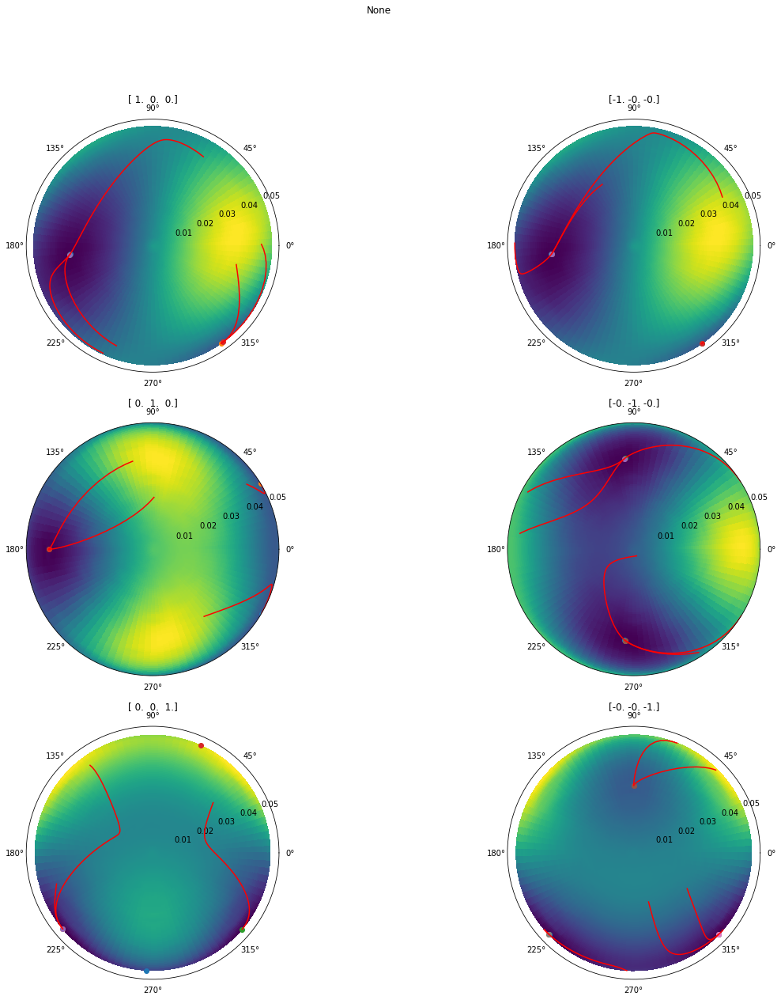

-75.97273568424839 [ 0.0037108 -0.046221   0.0187042] 0.00014286506639 0.0714325331948
-75.97274591150205 [ 0.0044094 -0.0473661  0.0153951] 0.00014277643802 0.0713882190099
-75.97275596870041 [ 0.0051867 -0.0482539  0.0120274] 0.000138318972381 0.0691594861903
-75.97276526932248 [ 0.0060347 -0.0488605  0.0087313] 0.000130098992613 0.0650494963064
-75.97277339317552 [ 0.0069445 -0.0491946  0.0056275] 0.00011931000381 0.0596550019052
-75.97278015973527 [ 0.0079084 -0.0492907  0.0028072] 0.000107383099674 0.053691549837
-75.97278560915304 [ 0.0089206 -0.0491967  0.0003232] 9.5637742164e-05 0.047818871082
-75.97278992482684 [ 0.0099779 -0.0489609 -0.0018078] 8.5062605927e-05 0.0425313029635
-75.97279334831622 [ 0.011078  -0.0486245 -0.003596 ] 7.62511448169e-05 0.0381255724084
-75.97279611779196 [ 0.0122193 -0.0482183 -0.0050675] 6.94319333823e-05 0.0347159666912
-75.97279843602 [ 0.0133994 -0.0477631 -0.006256 ] 6.45368061138e-05 0.0322684030569
-75.97280045999041 [ 0.0146149 -0.0472718 

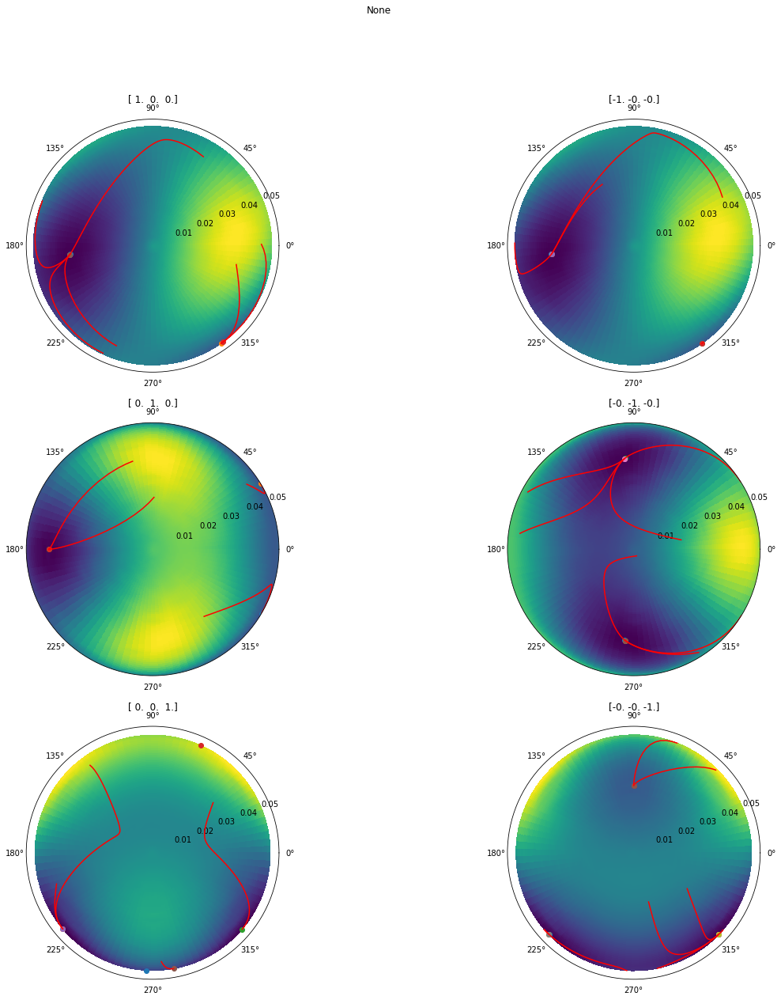

-75.97272961734427 [ 0.0320996 -0.0030163  0.0382167] 7.48896807537e-05 0.0374448403769
-75.9727325170494 [ 0.0328846 -0.0045035  0.0373942] 8.01269951161e-05 0.040063497558
-75.97273584417734 [ 0.0337493 -0.006011   0.0363985] 8.60135782129e-05 0.0430067891064
-75.97273967729201 [ 0.0346729 -0.0075566  0.0352234] 9.22219496757e-05 0.0461109748379
-75.97274407451715 [ 0.0356312 -0.0091514  0.0338626] 9.84232404162e-05 0.0492116202081
-75.97274906488906 [ 0.0365968 -0.010799   0.0323118] 0.000104258254638 0.0521291273189
-75.97275463675129 [ 0.0375391 -0.0124954  0.0305726] 0.000109331149884 0.0546655749419
-75.97276072620085 [ 0.0384252 -0.0142281  0.0286543] 0.000113228168431 0.0566140842153
-75.97276721019183 [ 0.0392224 -0.0159769  0.0265771] 0.000115560927874 0.0577804639372
-75.97277390943654 [ 0.0399013 -0.0177156  0.024373 ] 0.000116027146084 0.0580135730422
-75.97278060443986 [ 0.0404395 -0.0194139  0.0220849] 0.000114471018481 0.0572355092405
-75.97278706338864 [ 0.0408244 -0.

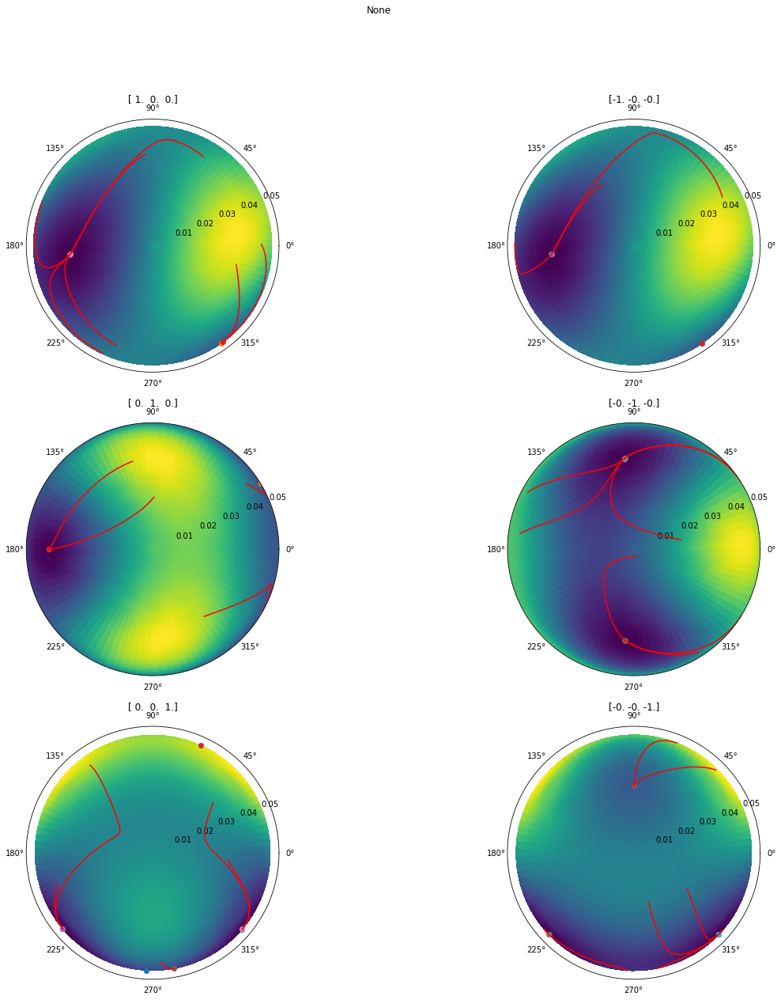

-75.9726824721266 [ 0.0492263  0.0051229 -0.0071081] 0.000239591089739 0.119795544869
-75.97271189734074 [ 0.0495395 -0.0008424 -0.0067179] 0.000248667215408 0.124333607704
-75.97274235900234 [ 0.0491534 -0.0069914 -0.0059217] 0.000237967533846 0.118983766923
-75.97276912886326 [ 0.0481018 -0.0127471 -0.0048714] 0.000209299869847 0.104649934924
-75.97278914267469 [ 0.0466285 -0.0176465 -0.003793 ] 0.000171629188794 0.085814594397
-75.97280230529249 [ 0.0450396 -0.0215217 -0.002872 ] 0.000134506683056 0.0672533415279
-75.97281030288313 [ 0.0435541 -0.024459  -0.0021901] 0.000103203138839 0.0516015694197
-75.9728149987859 [ 0.0422692 -0.0266509 -0.0017448] 7.88906344496e-05 0.0394453172248
-75.97281774946592 [ 0.0412006 -0.0282892 -0.0014943] 6.07302419933e-05 0.0303651209966
-75.97281938816609 [ 0.0403269 -0.0295264 -0.0013896] 4.73603272256e-05 0.0236801636128
-75.97282039155127 [ 0.0396163 -0.0304734 -0.001387 ] 3.75225352235e-05 0.0187612676117
-75.97282102602627 [ 0.0390374 -0.03120

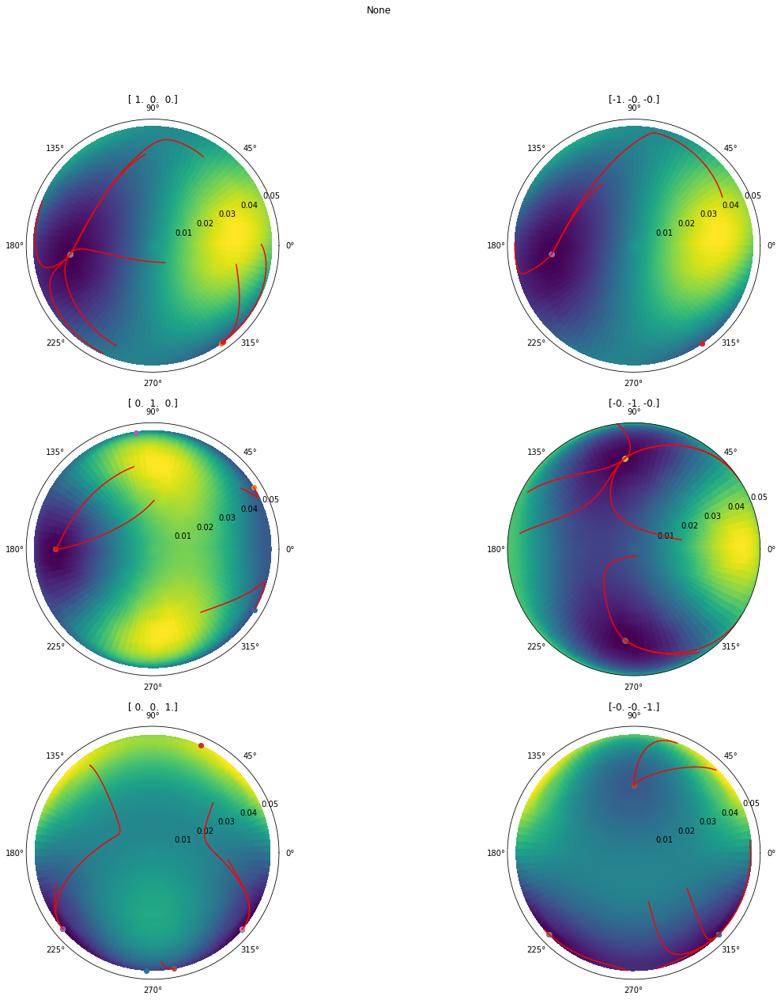

-75.97269483430875 [ 0.0013198 -0.0377817  0.0327231] 8.96690861838e-05 0.0448345430919
-75.97269911534289 [ 0.0016054 -0.039193   0.0310053] 0.000101143514118 0.0505717570592
-75.9727045313037 [ 0.0019538 -0.0406871  0.0289956] 0.000112804793285 0.0564023966426
-75.97271121700052 [ 0.0023748 -0.042226   0.0266707] 0.000123918531573 0.0619592657866
-75.97271920624797 [ 0.0028774 -0.0437555  0.0240246] 0.000133496520226 0.0667482601132
-75.97272836727637 [ 0.0034679 -0.0452069  0.0210787] 0.000140406017053 0.0702030085263
-75.97273836038477 [ 0.0041486 -0.0465051  0.0178903] 0.000143607002811 0.0718035014053
-75.97274865620943 [ 0.0049174 -0.0475816  0.0145537] 0.000142471621441 0.0712358107206
-75.97275863484909 [ 0.0057675 -0.0483889  0.0111915] 0.000137051652096 0.0685258260478
-75.97276773761679 [ 0.0066894 -0.0489112  0.0079342] 0.000128130765385 0.0640653826923
-75.97277559960955 [ 0.0076732 -0.0491644  0.0048972] 0.000117005066789 0.0585025333944
-75.97278209967241 [ 0.0087104 -0

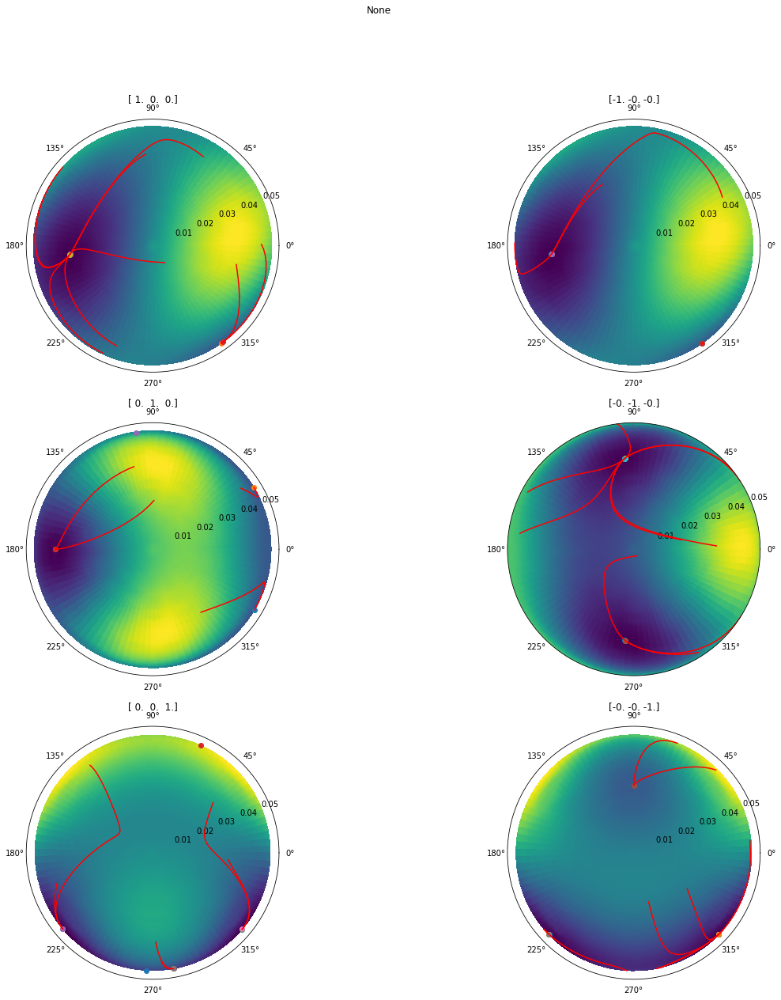

-75.97273441139184 [ 0.038588  -0.0021999  0.0317195] 0.000120114001572 0.0600570007858
-75.97274143859215 [ 0.0387546 -0.0051469  0.0311704] 0.000115099878244 0.0575499391221
-75.97274800515407 [ 0.0390621 -0.0078415  0.0302103] 0.000113913436101 0.0569567180505
-75.97275450580098 [ 0.0394665 -0.0103393  0.028905 ] 0.000114762641052 0.057381320526
-75.97276112749468 [ 0.0399175 -0.01268    0.0273095] 0.000116139013096 0.0580695065481
-75.97276789759805 [ 0.0403656 -0.0148856  0.0254763] 0.000116940073604 0.0584700368018
-75.97277472668029 [ 0.0407662 -0.0169632  0.02346  ] 0.000116443355927 0.0582216779637
-75.97278145045429 [ 0.0410842 -0.0189095  0.0213196] 0.000114261237636 0.0571306188182
-75.97278787321679 [ 0.0412964 -0.0207154  0.0191175] 0.000110303832261 0.0551519161303
-75.97279381022672 [ 0.041393  -0.0223715  0.0169155] 0.000104728724281 0.0523643621407
-75.9727991207587 [ 0.0413764 -0.0238713  0.0147701] 9.78705713279e-05 0.0489352856639
-75.97280372591831 [ 0.0412587 -0.

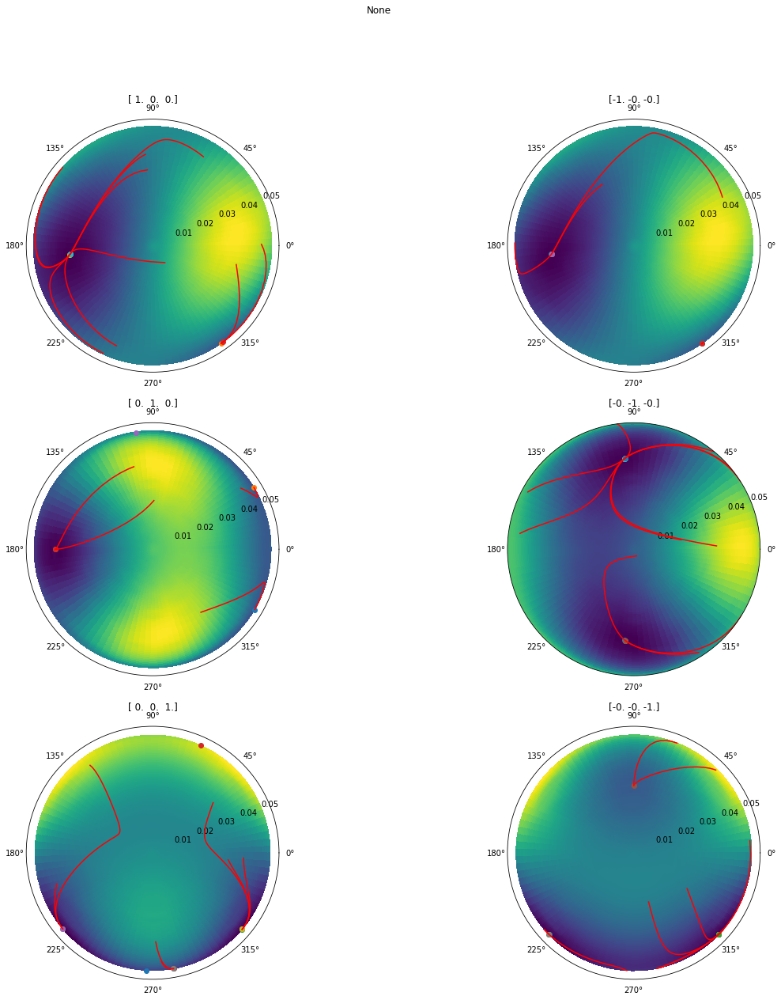

-75.97264519159077 [ 0.0154617  0.0470253 -0.0070395] 0.000174087046811 0.0870435234053
-75.97266091307164 [ 0.012928   0.047128  -0.0105745] 0.000186260328856 0.093130164428
-75.97267853053765 [ 0.0104513  0.0466986 -0.0144918] 0.000190830983928 0.0954154919639
-75.97269656800806 [ 0.0081649  0.0457053 -0.018557 ] 0.00018582659163 0.092913295815
-75.97271323789477 [ 0.0061835  0.0442272 -0.0224881] 0.000171688940682 0.085844470341
-75.97272714328486 [ 0.0045695  0.0424393 -0.026039 ] 0.000151299720273 0.0756498601367
-75.97273774968274 [ 0.0033222  0.0405476 -0.0290664] 0.00012850746612 0.0642537330601
-75.97274530840397 [ 0.0023944  0.0387223 -0.0315413] 0.000106461823726 0.0532309118628
-75.97275045884078 [ 0.0017199  0.0370668 -0.0335126] 8.69210941226e-05 0.0434605470613
-75.9727538797357 [ 0.0012347  0.0356238 -0.0350631] 7.04644145491e-05 0.0352322072745
-75.97275612499547 [ 0.0008865  0.0343967 -0.0362779] 5.69900008422e-05 0.0284950004211
-75.97275759373494 [ 0.0006358  0.0333

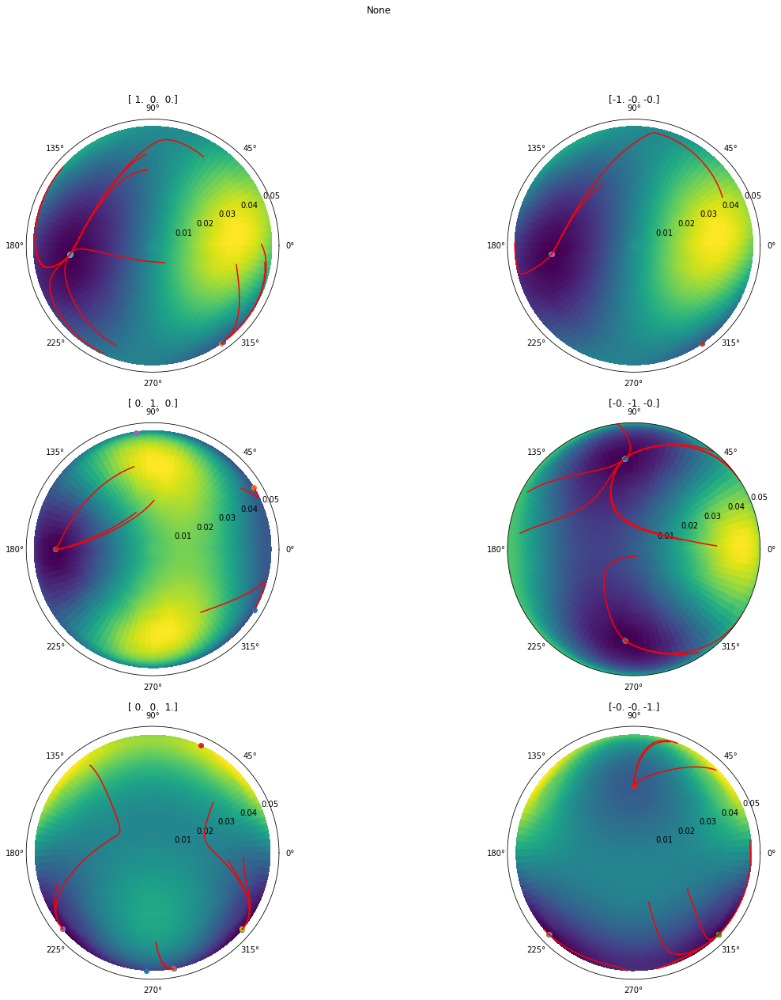

-75.97277984157512 [ 0.0358305 -0.0260232  0.0232156] 0.000135774605126 0.0678873025628
-75.97278865017334 [ 0.0373331 -0.0264237  0.0201996] 0.000123679541023 0.0618397705116
-75.97279591862217 [ 0.0383954 -0.0269274  0.0173408] 0.000111409366113 0.0557046830565
-75.97280179385135 [ 0.0390841 -0.0274995  0.0147042] 9.95612510223e-05 0.0497806255112
-75.97280647247648 [ 0.0394756 -0.0281041  0.0123222] 8.84296048204e-05 0.0442148024102
-75.97281015491342 [ 0.039643  -0.0287111  0.0102033] 7.81519735765e-05 0.0390759867883
-75.97281302572208 [ 0.0396492 -0.0292982  0.0083401] 6.87878868204e-05 0.0343939434102
-75.97281524645993 [ 0.0395451 -0.0298511  0.0067152] 6.03507168607e-05 0.0301753584304
-75.97281695390993 [ 0.0393698 -0.0303622  0.0053066] 5.28201799608e-05 0.0264100899804
-75.97281826078364 [ 0.0391521 -0.0308283  0.0040905] 4.61510916329e-05 0.0230755458164
-75.9728192579712 [ 0.0389129 -0.0312494  0.0030434] 4.02811110716e-05 0.0201405555358
-75.97282001741996 [ 0.0386666 -0

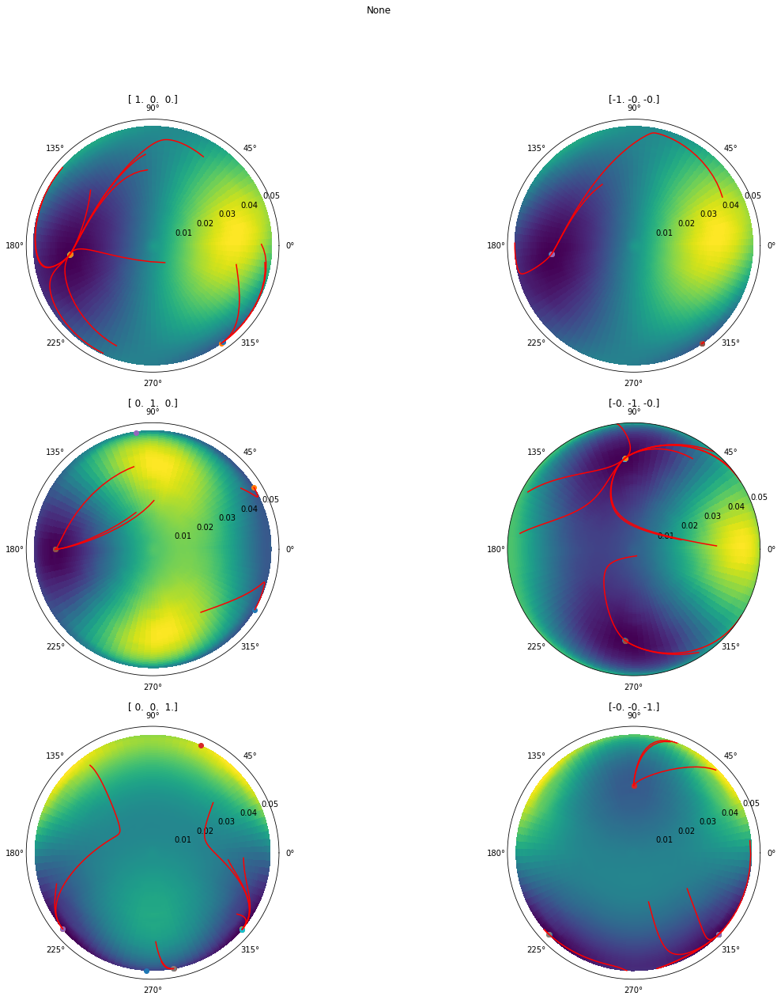

-75.97264299575787 [ 0.0413176  0.0205401  0.0192602] 0.000195319583441 0.0976597917204
-75.97266265624894 [ 0.0417014  0.0165618  0.0220614] 0.000205131305076 0.102565652538
-75.97268360364289 [ 0.0418161  0.0121068  0.0245935] 0.000201301696801 0.100650848401
-75.97270316538697 [ 0.0416942  0.0074803  0.0265638] 0.000186193944852 0.093096972426
-75.97271957834099 [ 0.0414529  0.0030002  0.0277968] 0.000166353431272 0.0831767156358
-75.97273262626572 [ 0.0412251 -0.001124   0.0282706] 0.000148285163713 0.0741425818563
-75.97274309284094 [ 0.0410968 -0.0048225  0.0280676] 0.000135341075469 0.0676705377345
-75.97275195123949 [ 0.0410914 -0.0081184  0.0273055] 0.000127614959746 0.063807479873
-75.97275993799605 [ 0.0411872 -0.011069   0.0260977] 0.000123455877883 0.0617279389413
-75.97276747030925 [ 0.0413411 -0.0137304  0.0245436] 0.000120913074402 0.0604565372012
-75.9727747051894 [ 0.0415049 -0.0161435  0.0227317] 0.000118456706501 0.0592283532506
-75.97278162703138 [ 0.041636  -0.018

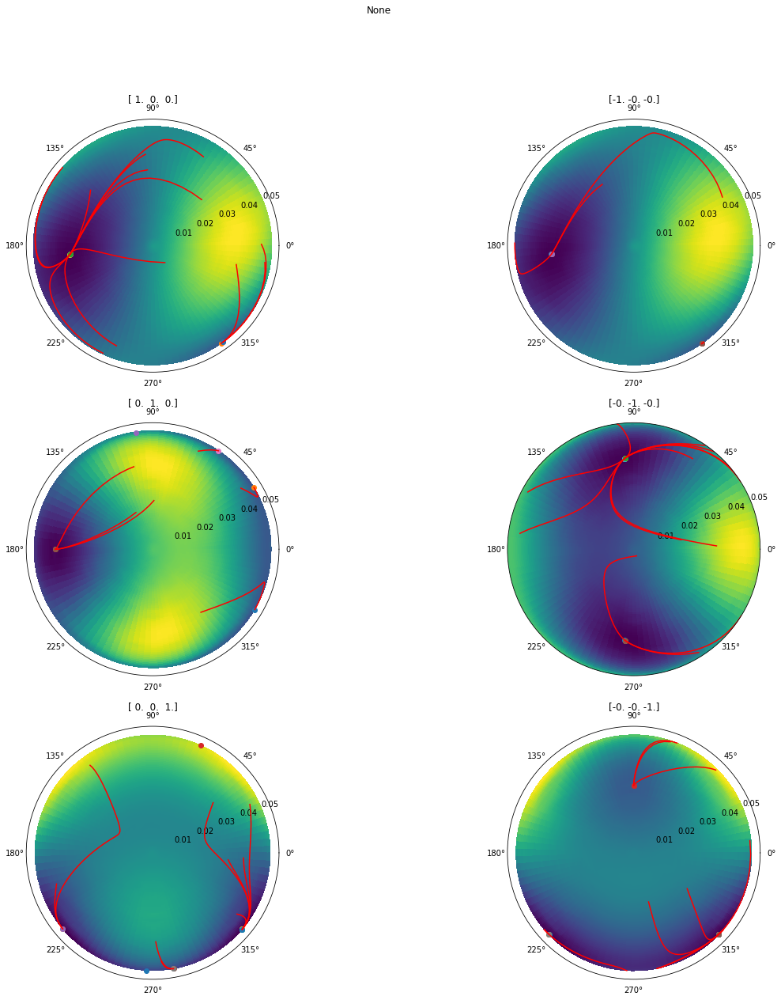

-75.97279348267175 [-0.00399   -0.0465619 -0.0177783] 3.43227388027e-05 0.0171613694013
-75.97279403936543 [-0.0043524 -0.046805  -0.0170395] 3.07265688832e-05 0.0153632844416
-75.97279449054315 [-0.0047493 -0.0469914 -0.0164088] 2.82142151306e-05 0.0141071075653
-75.97279487652253 [-0.0051836 -0.0471302 -0.0158706] 2.67283441669e-05 0.0133641720835
-75.97279522857043 [-0.0056581 -0.0472282 -0.0154105] 2.61680926934e-05 0.0130840463467
-75.97279557127811 [-0.0061759 -0.0472905 -0.0150156] 2.63971918984e-05 0.0131985959492
-75.97279592450418 [-0.0067398 -0.0473207 -0.0146741] 2.7265452036e-05 0.013632726018
-75.97279630486298 [-0.0073528 -0.0473209 -0.014376 ] 2.86316379049e-05 0.0143158189524
-75.97279672679954 [-0.0080175 -0.0472924 -0.014112 ] 3.03765467769e-05 0.0151882733884
-75.97279720331102 [-0.0087364 -0.0472354 -0.0138741] 3.24048824181e-05 0.016202441209
-75.97279774634958 [-0.0095116 -0.0471494 -0.0136551] 3.46402997896e-05 0.0173201498948
-75.97279836693482 [-0.0103445 -0.0

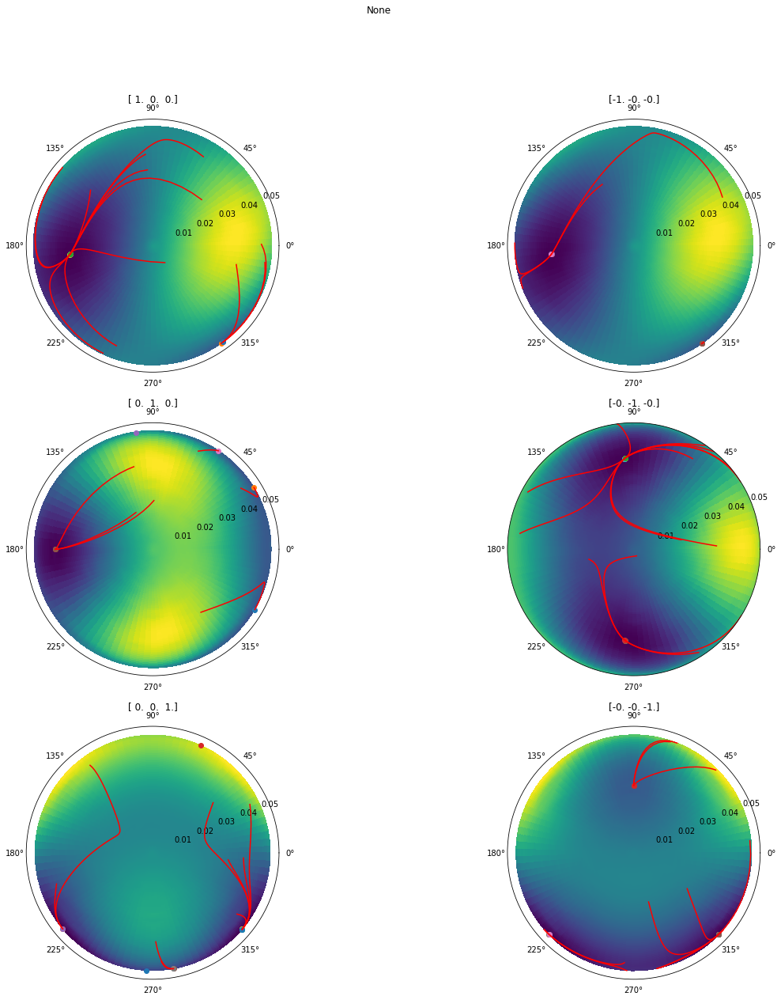

-75.97277476822951 [ 0.0243892 -0.0307439 -0.0309836] 0.000130594703788 0.0652973518938
-75.9727831853321 [ 0.0252814 -0.0324913 -0.0283754] 0.000126612860367 0.0633064301835
-75.97279097762406 [ 0.0261217 -0.0339993 -0.0257236] 0.000119049480263 0.0595247401314
-75.97279777415298 [ 0.0269032 -0.0352308 -0.0231302] 0.000108923535315 0.0544617676573
-75.97280340128336 [ 0.0276274 -0.0361792 -0.0206832] 9.74742041387e-05 0.0487371020693
-75.97280787130451 [ 0.0283003 -0.0368635 -0.0184438] 8.58359445714e-05 0.0429179722857
-75.97281131983219 [ 0.0289296 -0.0373187 -0.0164437] 7.48365506565e-05 0.0374182753282
-75.97281393456271 [ 0.0295214 -0.0375861 -0.0146893] 6.49492234114e-05 0.0324746117057
-75.97281590316342 [ 0.0300799 -0.0377063 -0.0131695] 5.63501418862e-05 0.0281750709431
-75.9728173865259 [ 0.030607  -0.0377158 -0.0118632] 4.90150668239e-05 0.024507533412
-75.97281851094773 [ 0.0311032 -0.0376449 -0.0107451] 4.28109366496e-05 0.0214054683248
-75.97281937060531 [ 0.0315681 -0.0

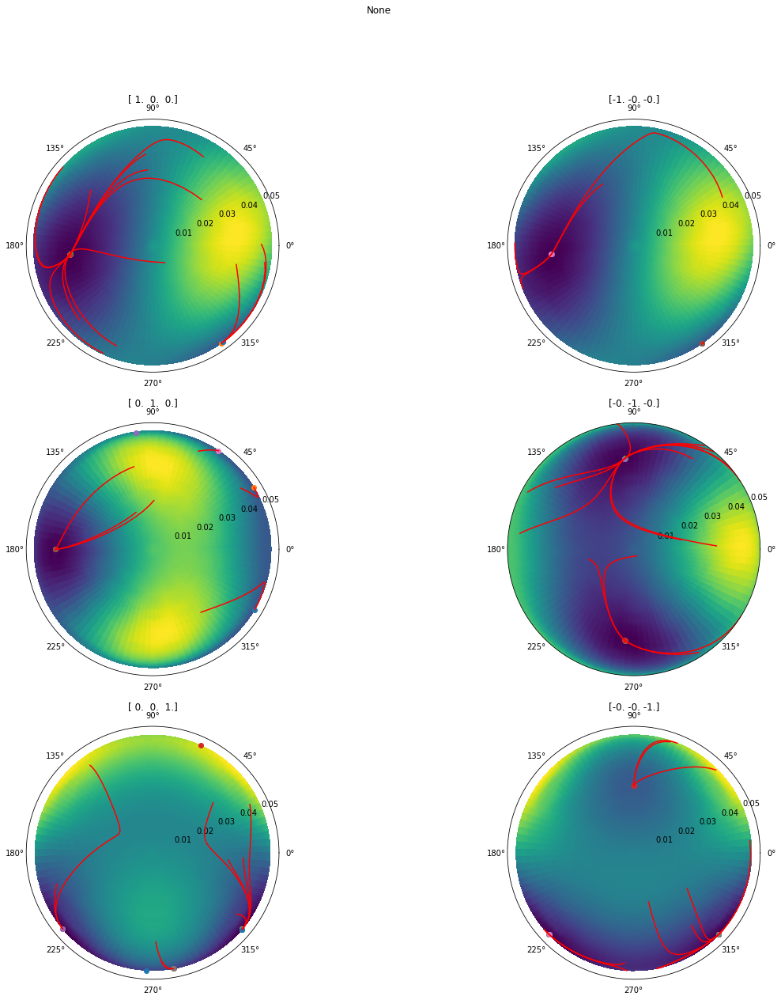

-75.97271756976934 [ 0.0394335  0.0040658  0.0304708] 0.000150515245701 0.0752576228504
-75.9727282458523 [ 0.0392637  0.0003391  0.0309556] 0.000134266648387 0.0671333241935
-75.97273685910287 [ 0.0392467 -0.0030146  0.030832 ] 0.000123680131597 0.0618400657987
-75.97274430802753 [ 0.0393879 -0.0060378  0.0302017] 0.000118403486324 0.0592017431619
-75.97275124715922 [ 0.0396587 -0.008792   0.0291529] 0.000116788700869 0.0583943504344
-75.97275806212451 [ 0.0400135 -0.0113317  0.0277581] 0.000116989059106 0.0584945295528
-75.97276491803905 [ 0.0404013 -0.0136949  0.0260804] 0.000117491042166 0.0587455210829
-75.9727718160969 [ 0.0407732 -0.0159023  0.0241798] 0.00011723486073 0.0586174303649
-75.97277864613666 [ 0.0410876 -0.0179608  0.0221184] 0.000115579824283 0.0577899121414
-75.97278523685364 [ 0.0413139 -0.019868   0.0199605] 0.000112247143467 0.0561235717337
-75.97279140406079 [ 0.0414349 -0.021618   0.017771 ] 0.000107258147122 0.053629073561
-75.97279699118336 [ 0.0414464 -0.02

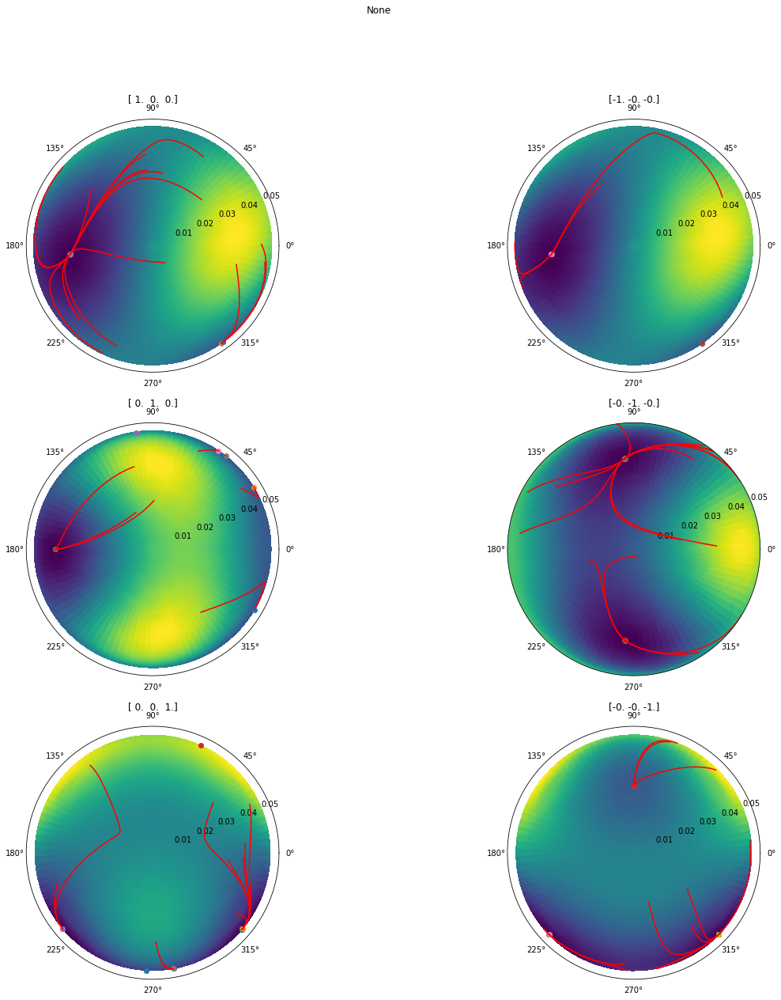

-75.97280449497053 [ 0.0181161 -0.0460949 -0.0068602] 6.48354112632e-05 0.0324177056316
-75.97280654863472 [ 0.0194659 -0.045444  -0.0074778] 6.20598289335e-05 0.0310299144667
-75.97280843636989 [ 0.0207977 -0.0447759 -0.0079103] 5.97295207436e-05 0.0298647603718
-75.97281018673567 [ 0.0220989 -0.0440978 -0.0081866] 5.75448318331e-05 0.0287724159165
-75.9728118099868 [ 0.0233575 -0.0434166 -0.0083323] 5.52998815261e-05 0.0276499407631
-75.97281330575916 [ 0.024562  -0.0427392 -0.0083706] 5.28765406154e-05 0.0264382703077
-75.97281466915209 [ 0.0257026 -0.0420729 -0.0083216] 5.02287284499e-05 0.025114364225
-75.9728158951345 [ 0.0267714 -0.0414245 -0.0082037] 4.73638066807e-05 0.0236819033403
-75.97281698128904 [ 0.0277631 -0.0408006 -0.0080327] 4.43245157029e-05 0.0221622578515
-75.97281792911663 [ 0.0286746 -0.0402066 -0.0078227] 4.11731150038e-05 0.0205865575019
-75.97281874418913 [ 0.0295054 -0.0396471 -0.0075856] 3.79786641132e-05 0.0189893320566
-75.97281943553654 [ 0.0302568 -0.0

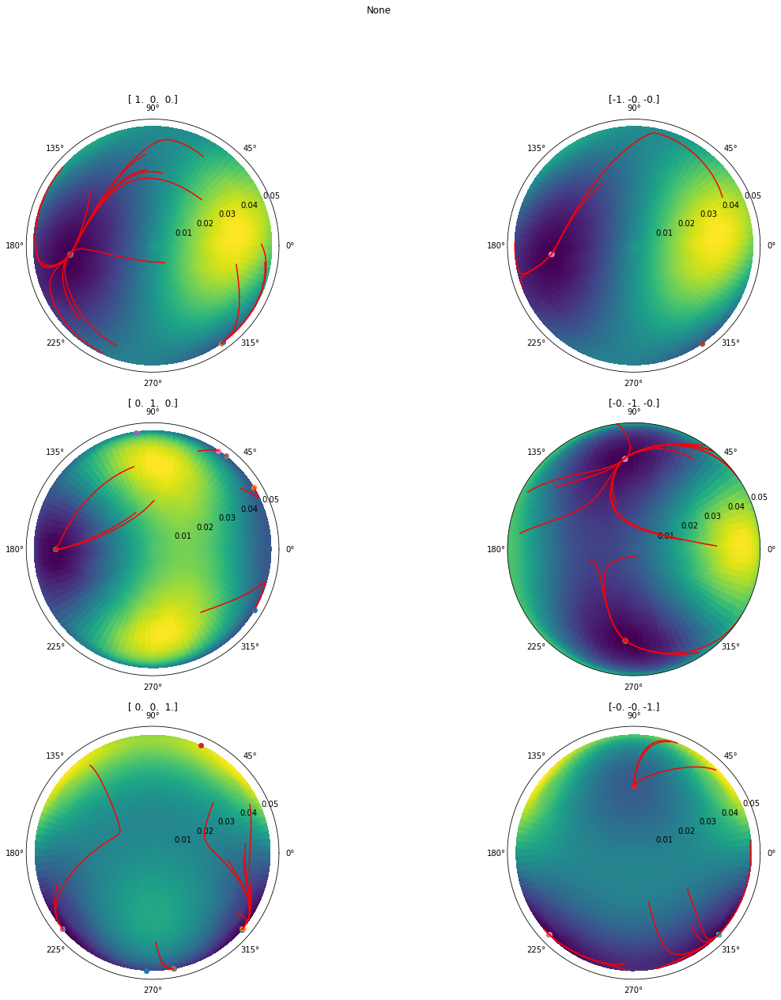

-75.9726288527224 [ 0.0119291  0.0484668  0.0029439] 0.000103679140643 0.0518395703215
-75.97263451352848 [ 0.0102878  0.0489202  0.0009903] 0.000115376376589 0.0576881882945
-75.9726415693951 [ 0.0087338  0.0492108 -0.0014216] 0.000129664519699 0.0648322598496
-75.97265048355652 [ 0.0072828  0.0492779 -0.0043187] 0.000145363126125 0.0726815630627
-75.97266160723666 [ 0.0059488  0.0490456 -0.0076901] 0.000160290126517 0.0801450632584
-75.97267493781284 [ 0.0047464  0.0484364 -0.0114626] 0.00017144163162 0.0857208158102
-75.97268987416106 [ 0.0036912  0.0473987 -0.0154835] 0.000175737757091 0.0878688785454
-75.9727051852088 [ 0.0027971  0.0459431 -0.0195297] 0.000171314558397 0.0856572791987
-75.97271937107011 [ 0.0020699  0.044162  -0.0233546] 0.000158614434317 0.0793072171586
-75.97273126013143 [ 0.001503   0.0422105 -0.0267584] 0.000140254200755 0.0701271003774
-75.97274039423213 [ 0.0010767  0.0402554 -0.0296369] 0.000119657133824 0.059828566912
-75.97274696305995 [ 0.0007646  0.038

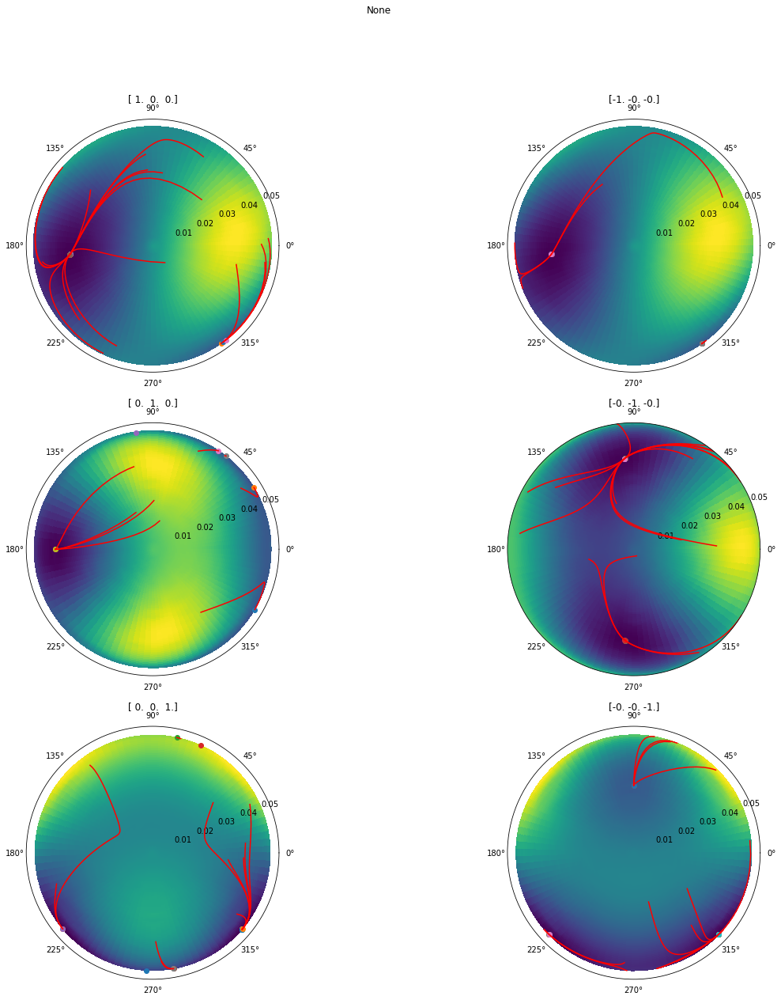

-75.97269757349679 [ 0.0142845 -0.0205145  0.0433025] 9.73810581218e-05 0.0486905290609
-75.97270254896782 [ 0.0165816 -0.0199214  0.0427573] 0.00010673601647 0.0533680082349
-75.9727084691981 [ 0.0190681 -0.0193523  0.041975 ] 0.000114844459509 0.0574222297543
-75.97271525409309 [ 0.0216893 -0.0188483  0.0409184] 0.00012119732683 0.060598663415
-75.97272273657826 [ 0.0243711 -0.0184583  0.0395644] 0.000125542787052 0.0627713935261
-75.97273069668009 [ 0.0270273 -0.0182332  0.0379088] 0.000127977273515 0.0639886367574
-75.97273891403907 [ 0.0295705 -0.0182168  0.0359685] 0.000128885770274 0.064442885137
-75.97274721099497 [ 0.0319228 -0.0184375  0.0337786] 0.000128732555645 0.0643662778224
-75.97275546296487 [ 0.034024  -0.0189015  0.0313864] 0.000127820451352 0.0639102256761
-75.97276357610413 [ 0.0358338 -0.019592   0.028846 ] 0.000126170902971 0.0630854514855
-75.97277145357813 [ 0.0373324 -0.0204717  0.0262146] 0.000123582312837 0.0617911564185
-75.97277897529857 [ 0.0385171 -0.021

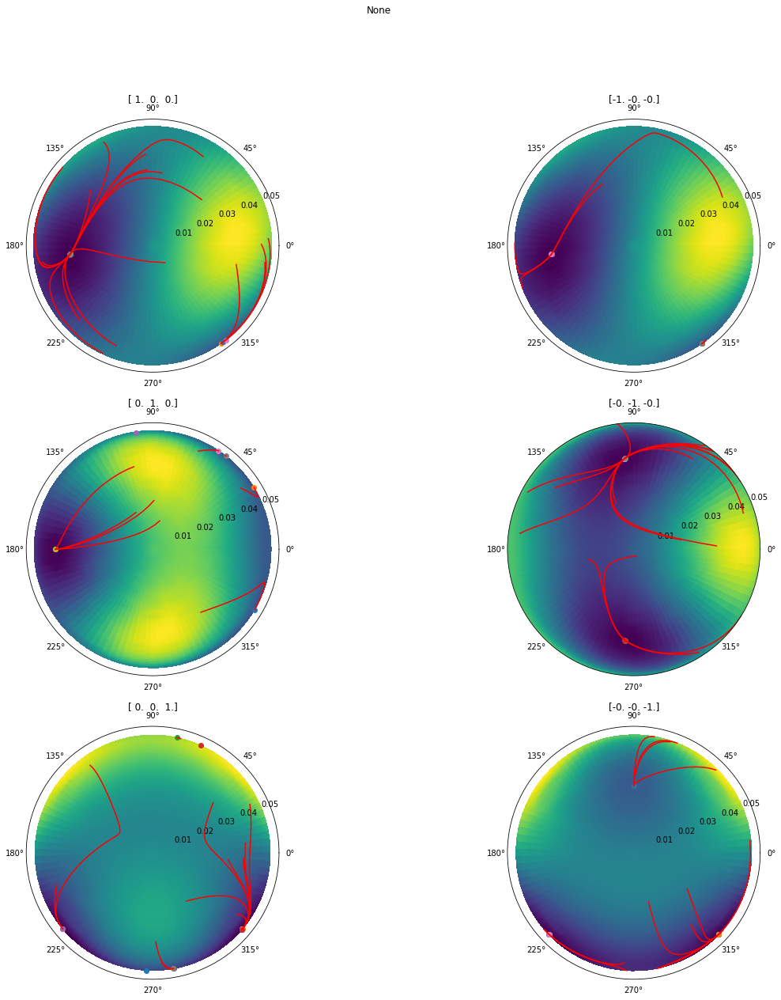

-75.9726912010945 [-0.0095731  0.0277783  0.0404564] 0.000113548844727 0.0567744223635
-75.97269727264379 [-0.0088866  0.0255378  0.0420577] 9.9976354419e-05 0.0499881772095
-75.97270193545572 [-0.0083006  0.0234835  0.0433546] 8.63598112919e-05 0.0431799056459
-75.97270539222458 [-0.0078061  0.0216532  0.044387 ] 7.3627536348e-05 0.036813768174
-75.97270789457141 [-0.0073919  0.0200553  0.0452011] 6.22567560992e-05 0.0311283780496
-75.97270967946326 [-0.007046   0.0186796  0.0458413] 5.23956589353e-05 0.0261978294676
-75.97271094222303 [-0.0067574  0.0175055  0.0463454] 4.39973915146e-05 0.0219986957573
-75.97271183226806 [-0.0065162  0.0165091  0.0467439] 3.69205641415e-05 0.0184602820708
-75.97271245907066 [-0.0063141  0.0156661  0.0470607] 3.09914382282e-05 0.0154957191141
-75.97271290088062 [-0.0061442  0.0149539  0.0473141] 2.60369061508e-05 0.0130184530754
-75.97271321288055 [-0.0060008  0.0143527  0.0475183] 2.1899822583e-05 0.0109499112915
-75.97271343373278 [-0.0058792  0.013

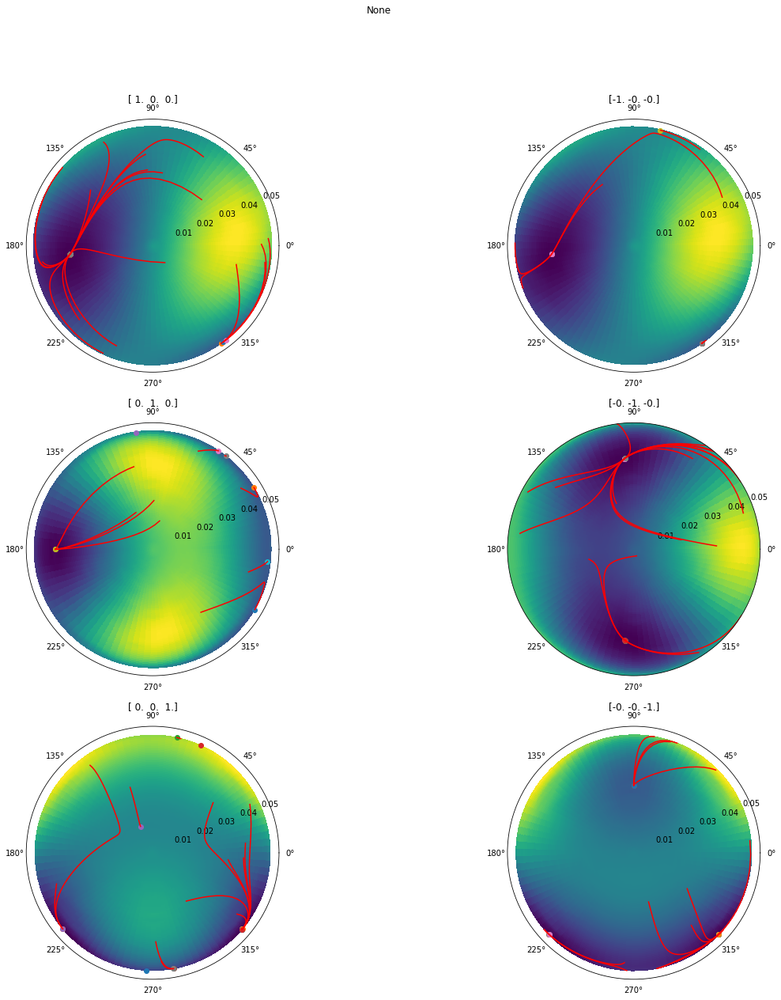

-75.9727310828637 [-0.0273269 -0.0121439 -0.040072 ] 8.6675943833e-05 0.0433379719165
-75.97273508504568 [-0.0277062 -0.0140766 -0.0391691] 9.79764541926e-05 0.0489882270963
-75.9727401772323 [-0.0281809 -0.0161768 -0.038002 ] 0.000109735673538 0.0548678367691
-75.97274651738113 [-0.0287317 -0.0184287 -0.0365359] 0.000121028235274 0.060514117637
-75.97275414712281 [-0.0293308 -0.0207935 -0.0347467] 0.000130620038085 0.0653100190426
-75.97276291185081 [-0.0299433 -0.0232053 -0.032633 ] 0.000137106201104 0.0685531005518
-75.97277241073492 [-0.0305315 -0.0255749 -0.0302284] 0.000139229393521 0.0696146967604
-75.97278202973636 [-0.0310628 -0.0278015 -0.0276075] 0.000136306102489 0.0681530512444
-75.97279108028575 [-0.0315172 -0.0297927 -0.0248809] 0.00012854490746 0.0642724537301
-75.97279899143284 [-0.0318912 -0.0314837 -0.0221749] 0.000117035861771 0.0585179308856
-75.97280545266446 [-0.0321961 -0.0328486 -0.0196057] 0.000103375061421 0.0516875307107
-75.97281043498853 [-0.0324507 -0.033

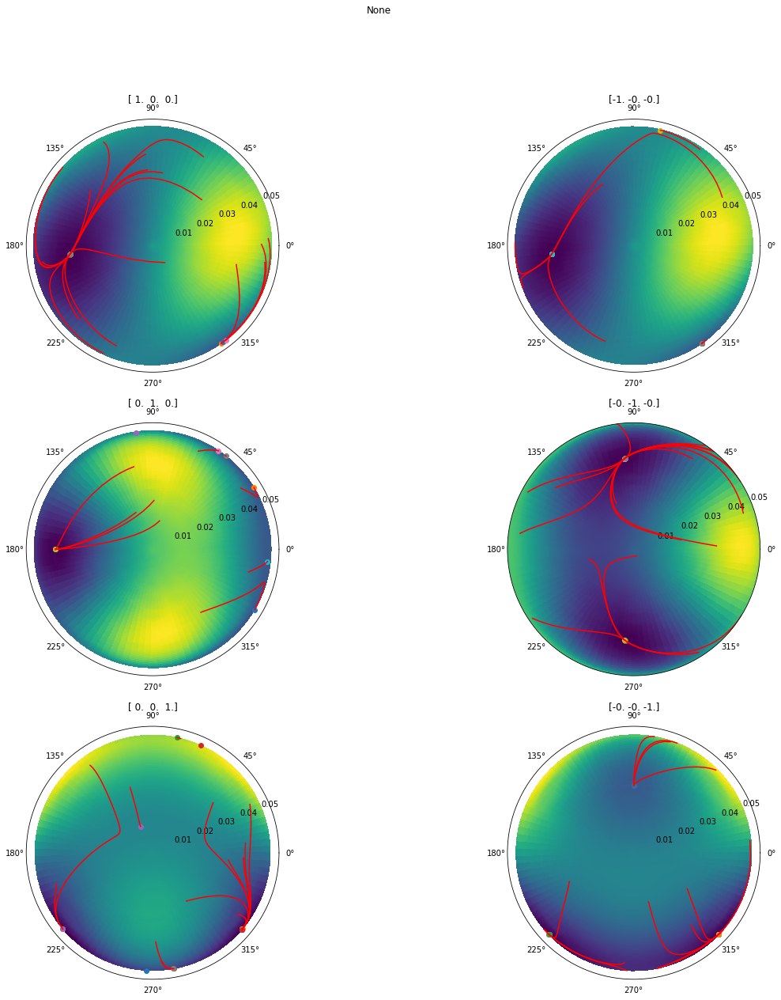

-75.9727705076391 [ 0.0458368 -0.0149193 -0.0132815] 0.000196330115518 0.0981650577592
-75.97278845353127 [ 0.0446116 -0.0193647 -0.0116109] 0.000167983155349 0.0839915776744
-75.97280130014272 [ 0.0432908 -0.0229695 -0.0099149] 0.000137114918936 0.0685574594679
-75.97280972706048 [ 0.0420256 -0.0257604 -0.0083814] 0.000108304623819 0.0541523119094
-75.97281493514095 [ 0.0409048 -0.0278642 -0.0070984] 8.38620448224e-05 0.0419310224112
-75.972818042034 [ 0.0399594 -0.0294329 -0.0060787] 6.42643292355e-05 0.0321321646177
-75.9728198625844 [ 0.0391849 -0.0306023 -0.0052953] 4.90413000081e-05 0.024520650004
-75.97282092241701 [ 0.0385607 -0.0314787 -0.0047078] 3.74132064971e-05 0.0187066032486
-75.97282153971415 [ 0.0380616 -0.0321409 -0.0042752] 2.86040426655e-05 0.0143020213327
-75.97282190110995 [ 0.0376636 -0.0326459 -0.003962 ] 2.19538775494e-05 0.0109769387747
-75.97282211444664 [ 0.0373463 -0.0330344 -0.0037393] 1.69380733233e-05 0.00846903666165
-75.97282224177742 [ 0.0370927 -0.03

GaussianException: 

In [79]:
paths = []
while True:
    dir = np.random.randn(normalized.n_dims)
    dir = dir / np.linalg.norm(dir) * MAX_R
    path = optimization.optimization.optimize_on_sphere(normalized, MAX_R, dir, 
                                         delta_strategies.FollowGradient(500), 
                                         stop_strategies.GradNorm(1e-6))
    paths.append(path)
    
    axs = plot_all_spheres(vects, values, figsize=(20, 20), n_grid=250, is_contour=True)
    for path in paths:
        plot_path(axs, path)
    plt.show()